In [43]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import sys
sys.path.append('../')
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from data.loadv2 import get_data, subsample
from data.utils import custom_cutout
from model.metrics import psnr, ssim
from model.losses import *

## Choose Devices

In [2]:
gpu_id = 4
num_cores = 4

In [3]:
torch.cuda.set_device(gpu_id)

# Model

## Load Critic

In [4]:
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF')  # path to dataset
critic_path = data_pth/f'EM/models/critics'  # path to saved models
critic_name = 'critic-patches-grey-toddler'

In [5]:
critic = load_learner(critic_path, f'{critic_name}.3b.pkl')

## Define Feature Loss

In [6]:
encoder = critic.model.eval()[0]
layers, prev_layer_idxs = grab_resnet_layers(encoder)
layers, prev_layer_idxs

([Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
  Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
  Conv2d(64, 128, kernel_size=(1, 1), stride=(2, 2), bias=False),
  Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
  Conv2d(128, 256, kernel_size=(1, 1), stride=(2, 2), bias=False),
  Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
  Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)],
 [[4, -1, -1],
  [5, 0, 4, -1],
  [5, -1, -1],
  [6, 0, 4, -1],
  [6, -1, -1],
  [7, 0, 4, -1]])

In [7]:
del(critic)
feat_loss = FeatureLoss(m_feat=encoder, layer_ids=prev_layer_idxs, 
                               layer_wgts=[1/6 for _ in range(6)])

## Initialization

In [8]:
nb_name = 'featloss-toddler-greyscale'
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF/')
lr_path = f'EM/training/trainsets/lr_greyscale/'
hr_path = f'EM/training/trainsets/hr_greyscale/'
model_path = data_pth/f'EM/models/feat_loss/'

In [9]:
# loading the 1st round of data
bs_1 = 64
size_1 = 128
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_1, in_sz=size_1, out_sz=size_1, max_zoom=6)
db = subsample(db, seed=49)
db.c = 3

In [10]:
arch = models.resnet34
wd = 1e-3
superres_metrics = [F.mse_loss, psnr, ssim]
learn = unet_learner(db, arch, wd=wd, 
                         loss_func=feat_loss,
                         metrics=superres_metrics, 
                         blur=False, 
                         norm_type=NormType.Weight, 
                         model_dir=model_path)
gc.collect()

0

In [11]:
learn = learn.load(f'emsynth_005_unet.5')

In [12]:
# loading the 1st round of data
bs_1 = 64
size_1 = 128
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_1, in_sz=size_1, out_sz=size_1, max_zoom=6)
db = subsample(db, seed=49)

In [13]:
learn.data = db

In [14]:
learn.model_dir = model_path
print(learn.model_dir)

/home/alaa/Dropbox/BPHO Staff/USF/EM/models/feat_loss


In [15]:
# grab weights from a single channel
kernel_weights = learn.model[0][0].weight[:, 1, :, :].unsqueeze(1)
print(kernel_weights.shape)
# change first layer of resnet to single-channel
learn.model[0][0] = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
# stick the weights you grabbed earlier into your new first layer
learn.model[0][0].weight = torch.nn.Parameter(data=kernel_weights, requires_grad=True)
print(learn.model[0][0].weight.shape)
# change Merge layers to single-channel input images
learn.model[0][0] = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
learn.model[10][0][0] = nn.Conv2d(97, 97, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
learn.model[10][1][0] = nn.Conv2d(97, 97, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
learn.model[11][0] = nn.Conv2d(97, 1, kernel_size=(1, 1), stride=(1, 1))
learn.model.cuda();

torch.Size([64, 1, 7, 7])
torch.Size([64, 1, 7, 7])


## Exporting to pkl

In [14]:
model_pth = '/home/alaa/Dropbox/BPHO Staff/USF/EM/models/baselines'
# nb_name = 'featureloss-adult-pretrained'
expt_num = '3b'
learn.export(f'{nb_name}.{expt_num}.pkl')

In [15]:
learn = load_learner(path=model_pth ,file=f'{nb_name}.{expt_num}.pkl')

## Load Model (optional)

In [16]:
# learn.model_dir = model_pth
# learn = learn.load(f'emsynth_005_unet.5')
# learn = learn.load(f'{nb_name}.1b')

In [20]:
# learn.loss_func = ssim_log_loss
# learn.loss_func

## Training

In [16]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


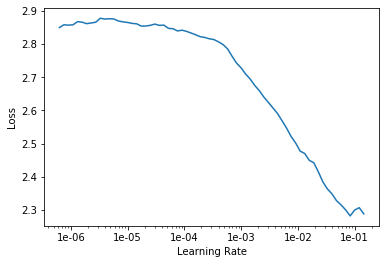

In [17]:
learn.recorder.plot()

### 1a

In [18]:
lr = 3e-3
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.1a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,1.135355,0.893629,0.186258,15.874860,0.274053,00:42
1,0.755552,0.568359,0.126148,17.565956,0.493240,00:42
2,0.660726,0.546185,0.113331,18.031347,0.517012,00:42


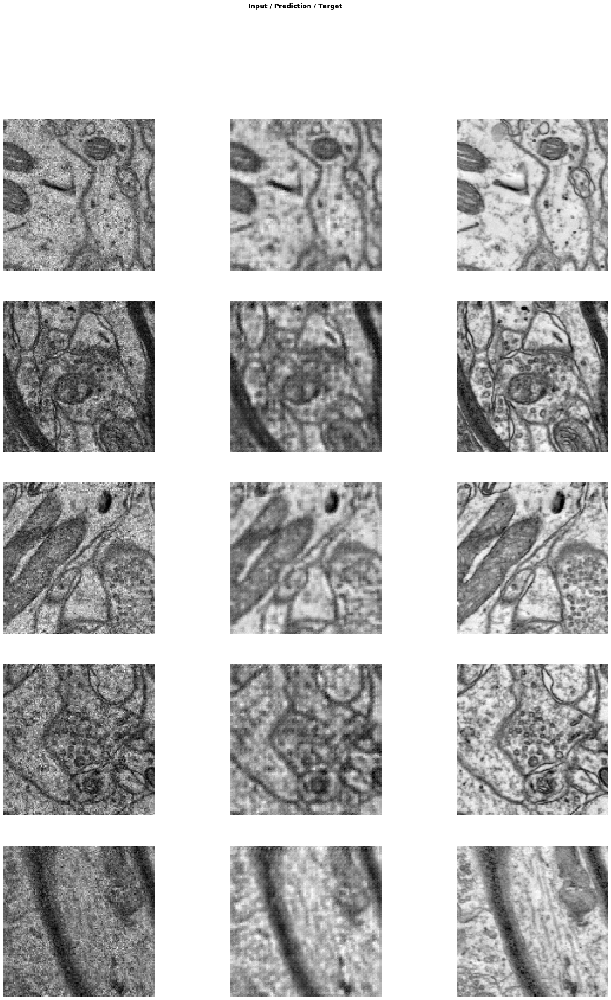

In [19]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

### 1b

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


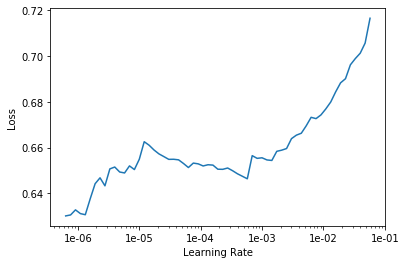

In [20]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [21]:
lr = slice(1e-5, 1e-3)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.1b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.671842,0.533008,0.109682,18.172895,0.537134,00:44
1,0.641098,0.508350,0.103431,18.428097,0.561692,00:44
2,0.635711,0.510420,0.098617,18.635096,0.564537,00:44


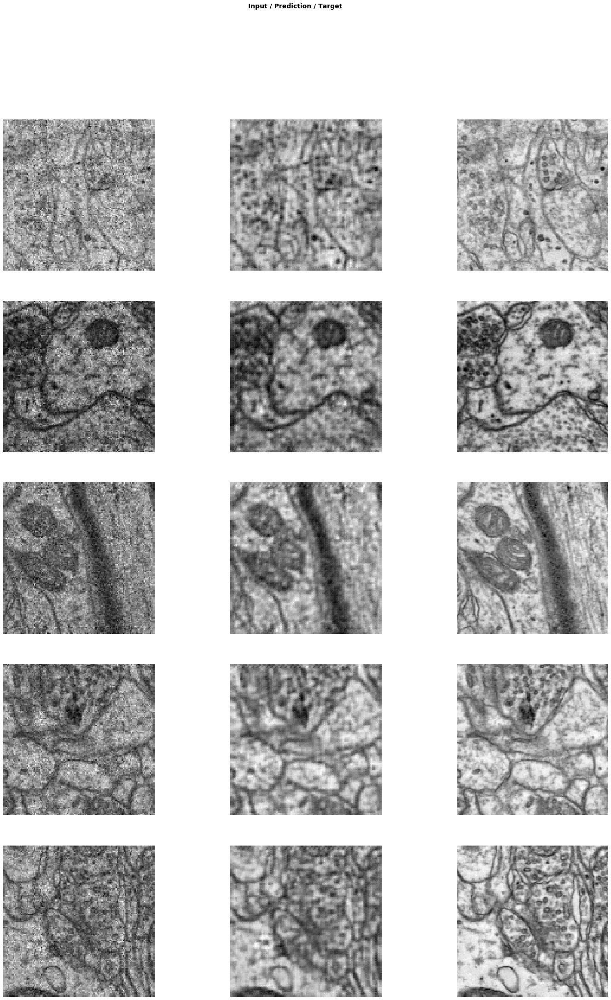

In [22]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

## 2a

In [23]:
# 2nd round of data
bs_2 = 32
size_2 = 256
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_2, in_sz=size_2, out_sz=size_2, max_zoom=3)
db = subsample(db, seed=6054)

In [24]:
gc.collect()

70

In [25]:
learn.data = db
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


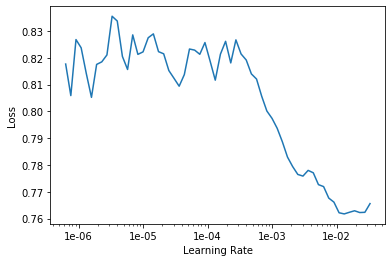

In [26]:
learn.lr_find()
learn.recorder.plot()

In [27]:
lr = 1e-3
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.2a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.655401,0.501422,0.100230,19.163244,0.431670,02:31
1,0.632329,0.481590,0.098391,19.244314,0.437332,02:29
2,0.615569,0.470296,0.097378,19.288963,0.440709,02:29


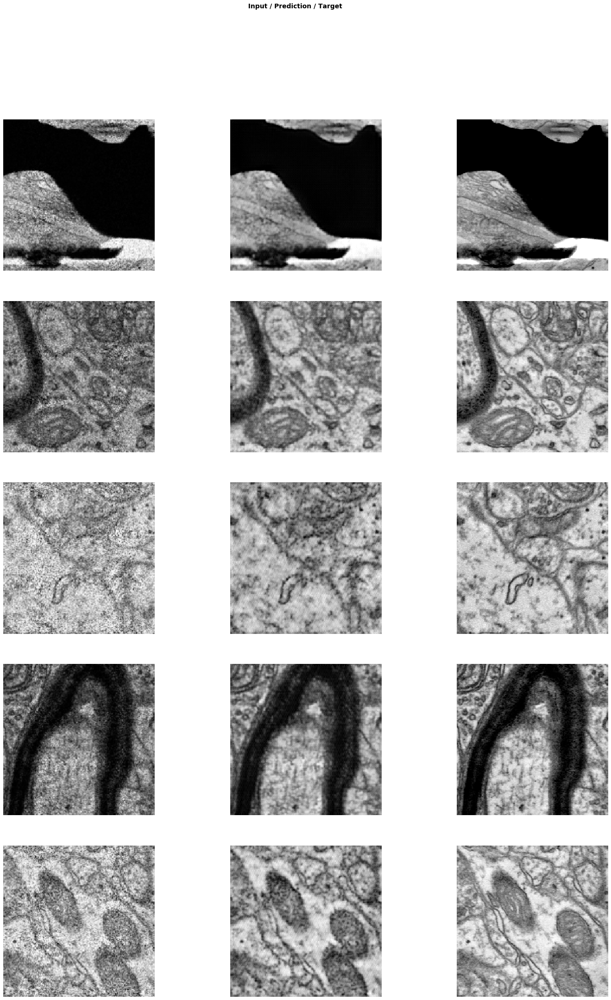

In [28]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

## 2b

In [29]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


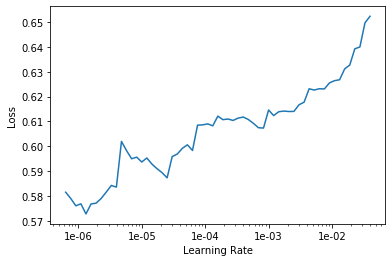

In [30]:
learn.lr_find()
learn.recorder.plot()

In [31]:
lr = slice(1e-5, 1e-3)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.2b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.618878,0.487026,0.096104,19.346359,0.437488,02:35
1,0.599794,0.477879,0.094917,19.399590,0.440782,02:35
2,0.581957,0.467423,0.098180,19.253824,0.442120,02:35


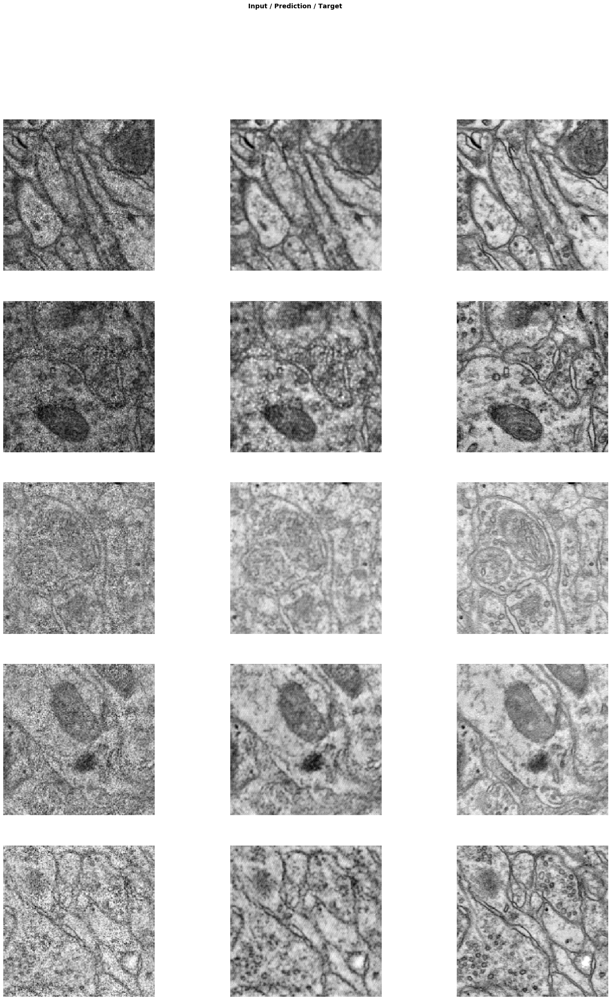

In [32]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

## 3a

In [33]:
# 3rd round of data
bs_3 = 8
size_3 = 512
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_3, in_sz=size_3, out_sz=size_3, max_zoom=2.)
db = subsample(db, seed=2020)

In [34]:
learn.data = db

In [35]:
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


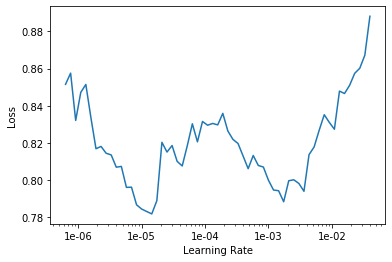

In [36]:
learn.lr_find()
learn.recorder.plot()

In [37]:
lr = 1e-3
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.3a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.680198,0.559638,0.131484,17.044775,0.214934,11:08
1,0.563670,0.533262,0.131415,17.055958,0.232486,11:04
2,0.543185,0.503516,0.122465,17.386786,0.234186,11:03


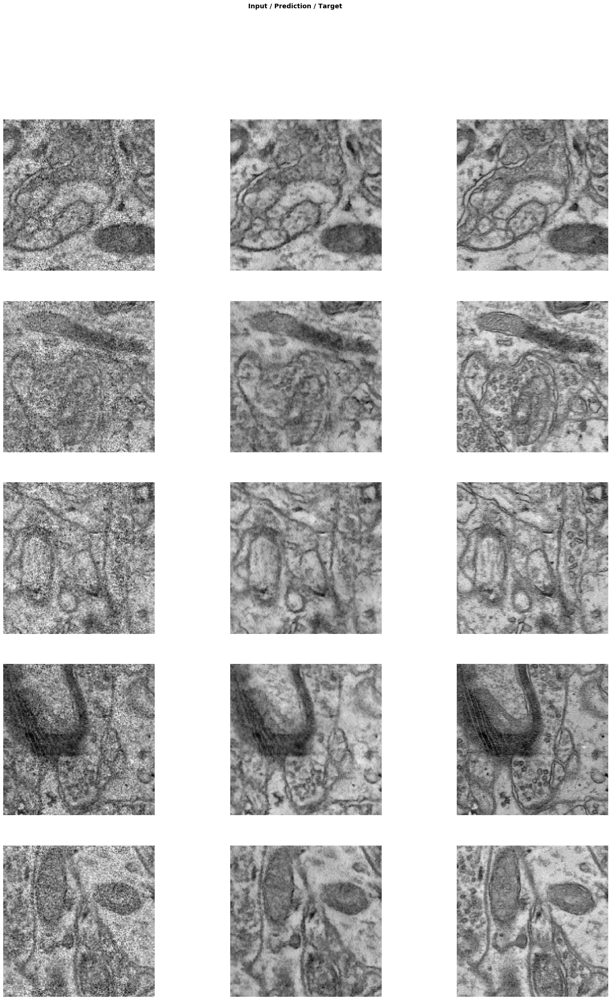

In [38]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)

### 3b

In [39]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


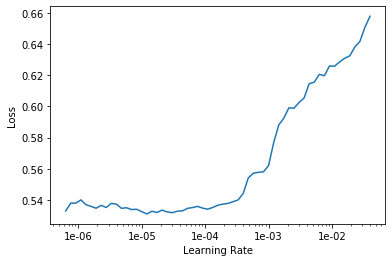

In [40]:
learn.lr_find()
learn.recorder.plot()

In [ ]:
lr = 3e-6
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.3b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.542340,0.502702,0.120465,17.439617,0.233101,11:30
1,0.538271,0.507211,0.120373,17.452213,0.229204,11:30


In [46]:
learn.validate()

[0.50645065, tensor(0.1235), tensor(17.3510), tensor(0.2354)]

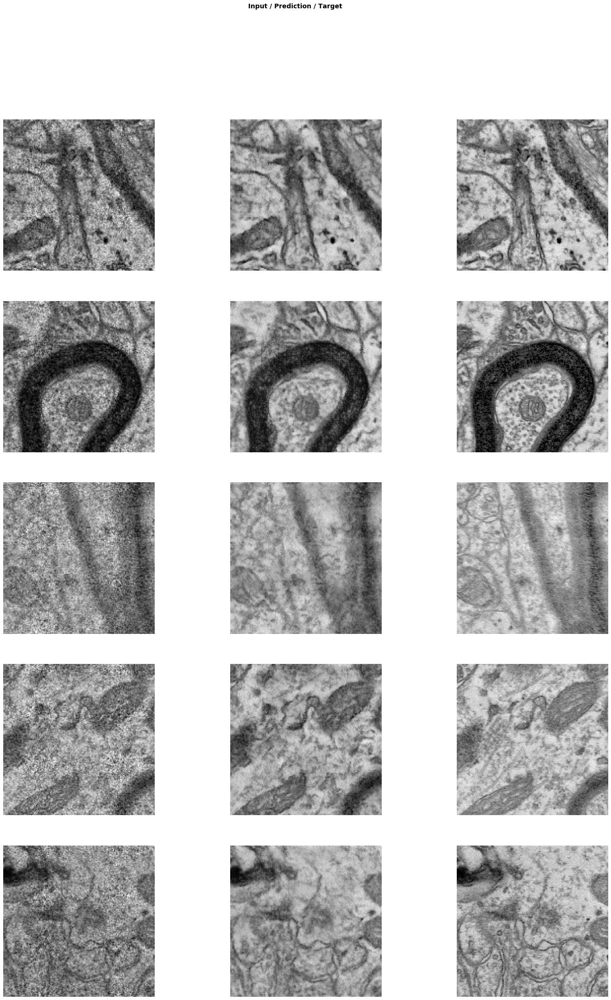

In [44]:
learn.show_results(rows=5, figsize=(25,35), cmap=plt.cm.gray)